In [6]:

from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.resnet50 import decode_predictions
from tensorflow.keras.preprocessing import image as keras_image
import numpy as np
import tensorflow as tf

In [63]:

import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd



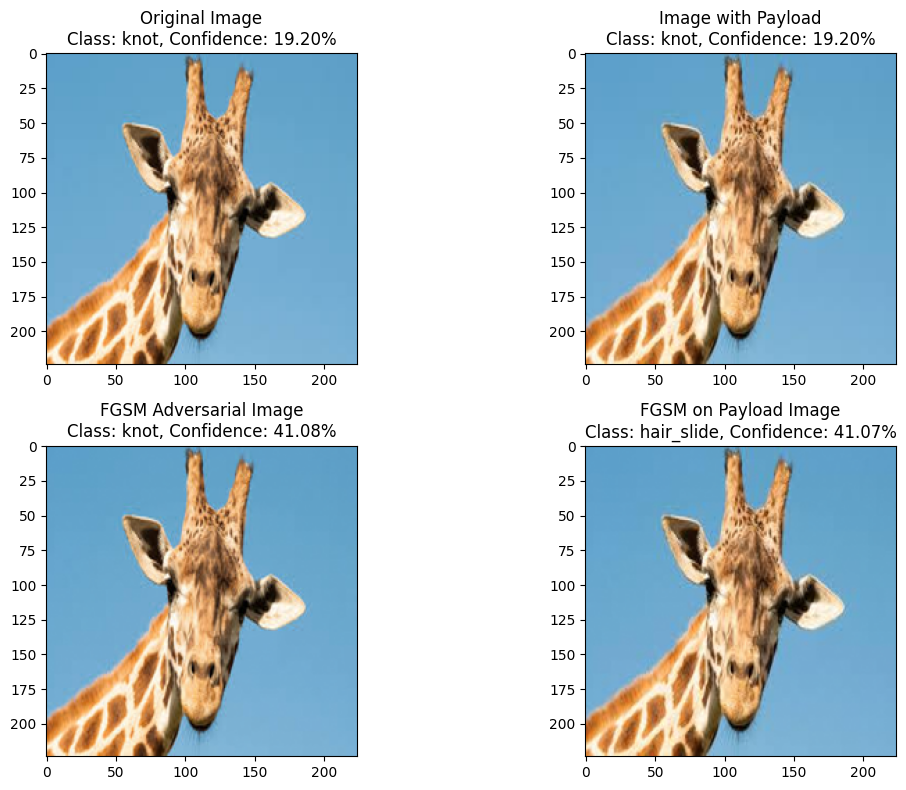

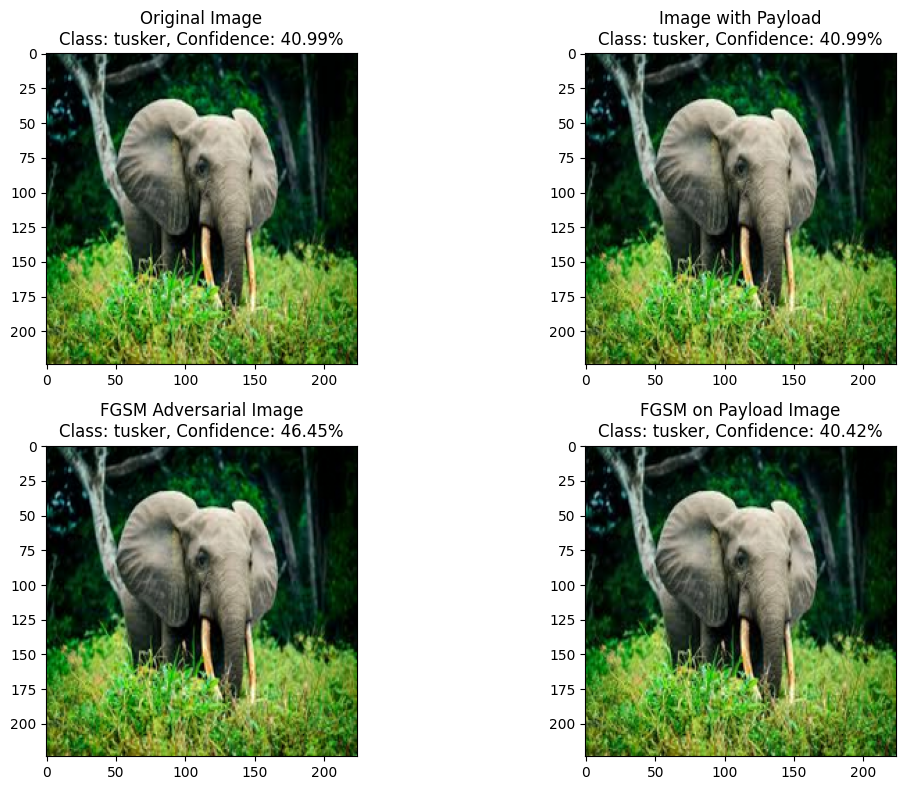

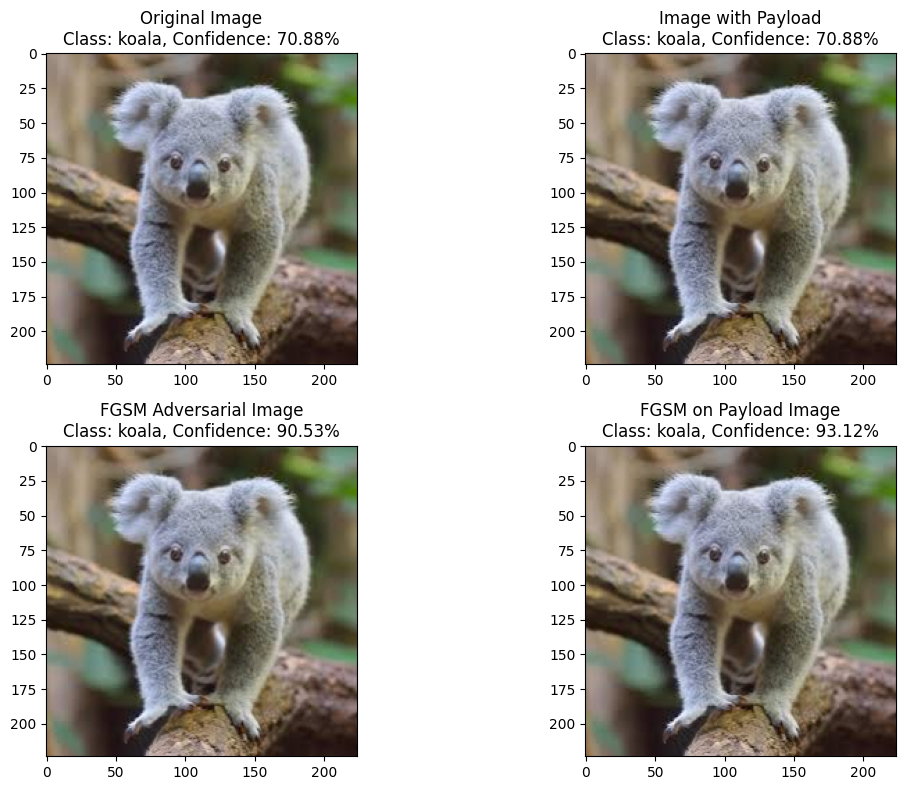

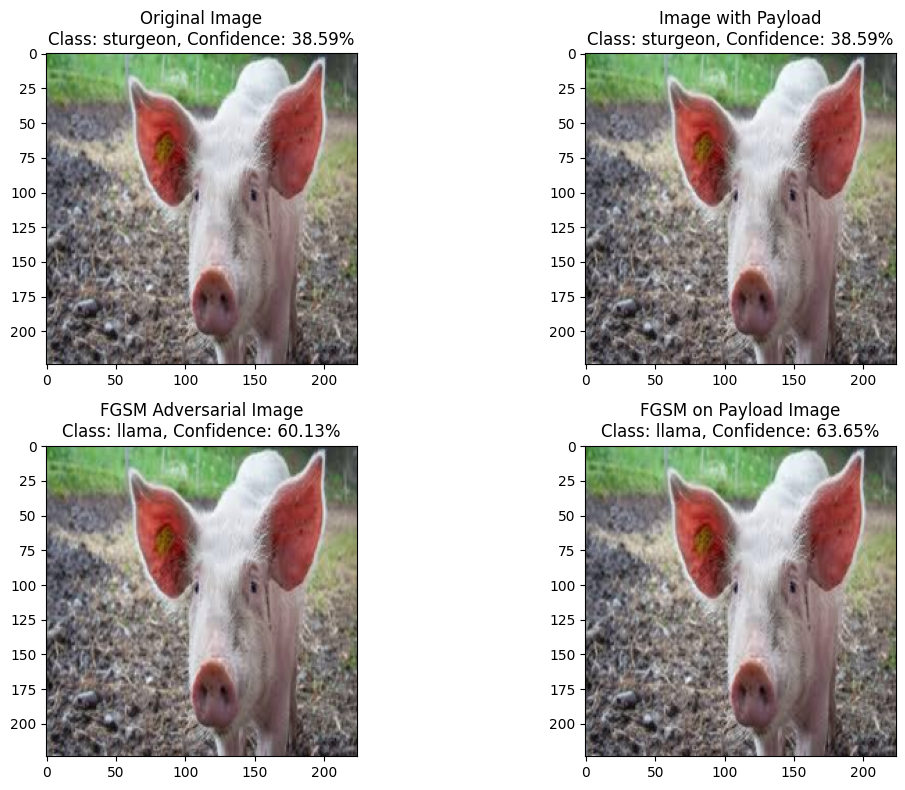

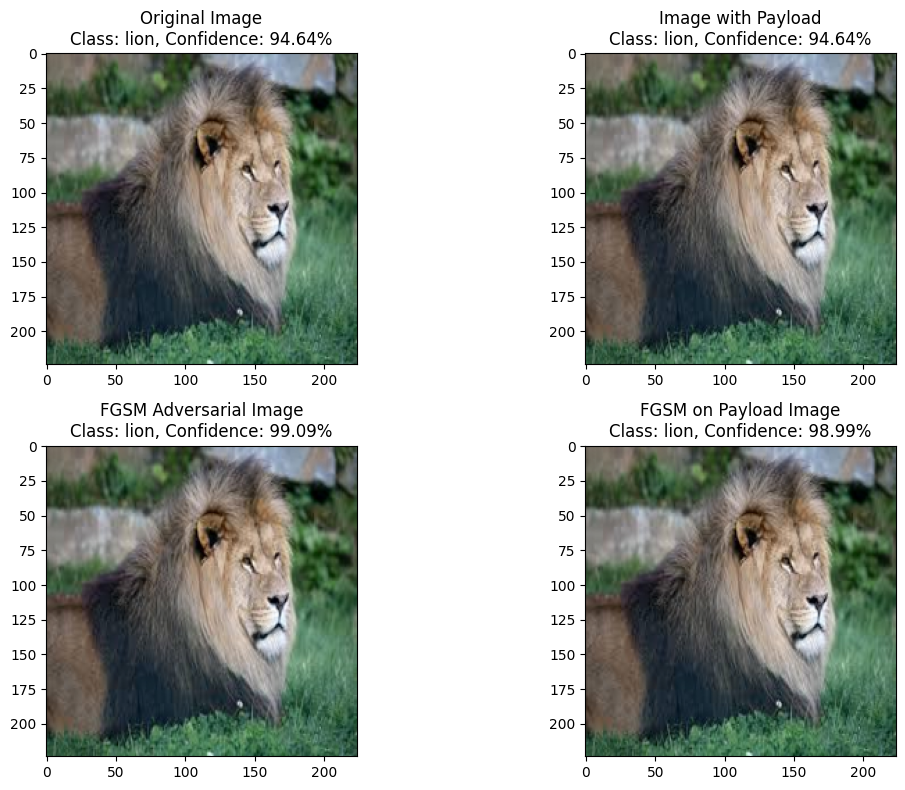

...

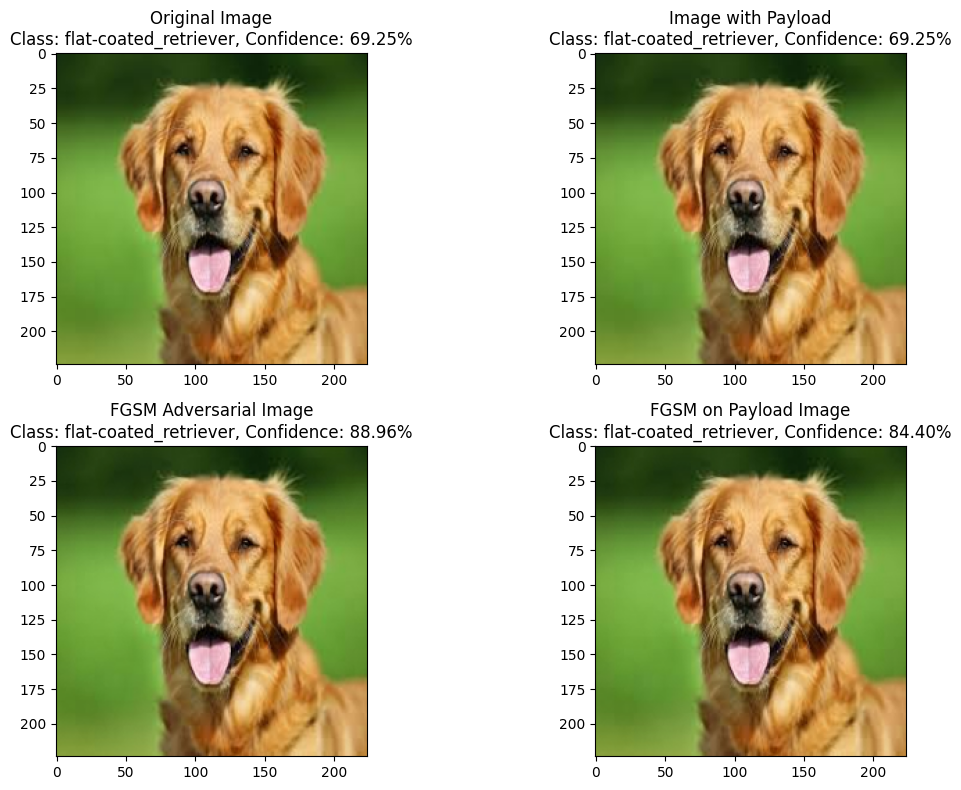

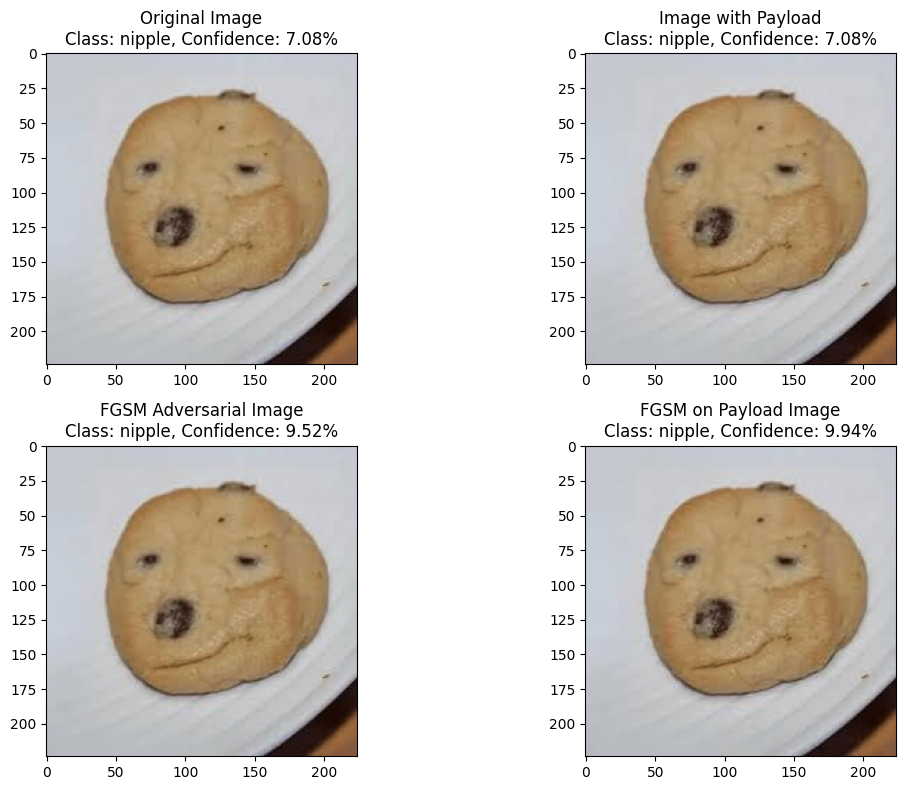

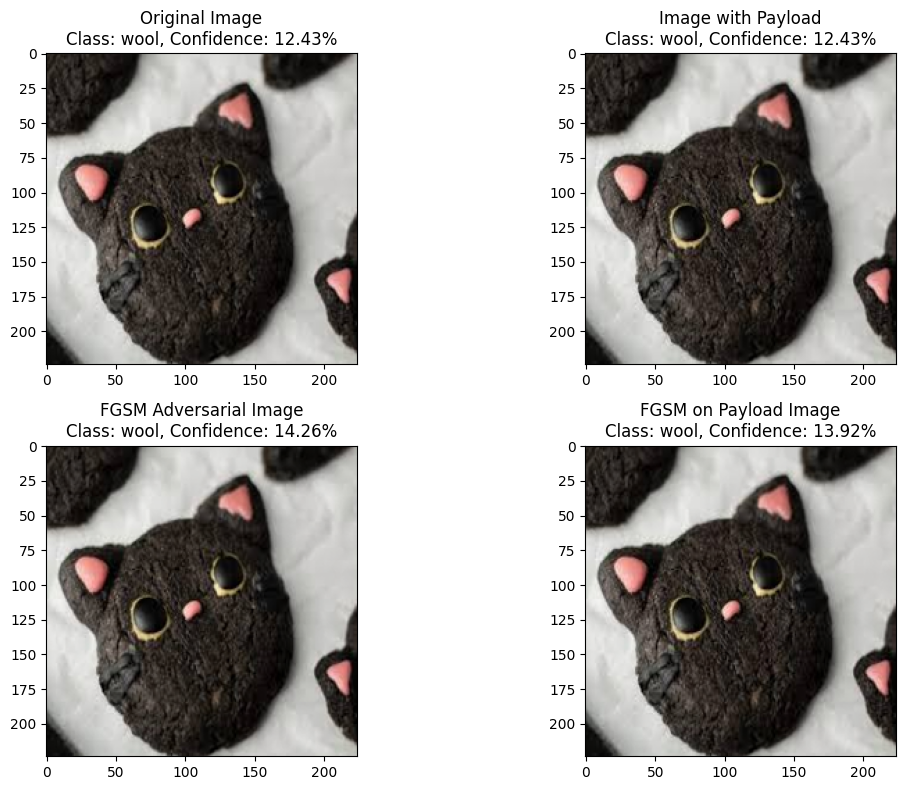

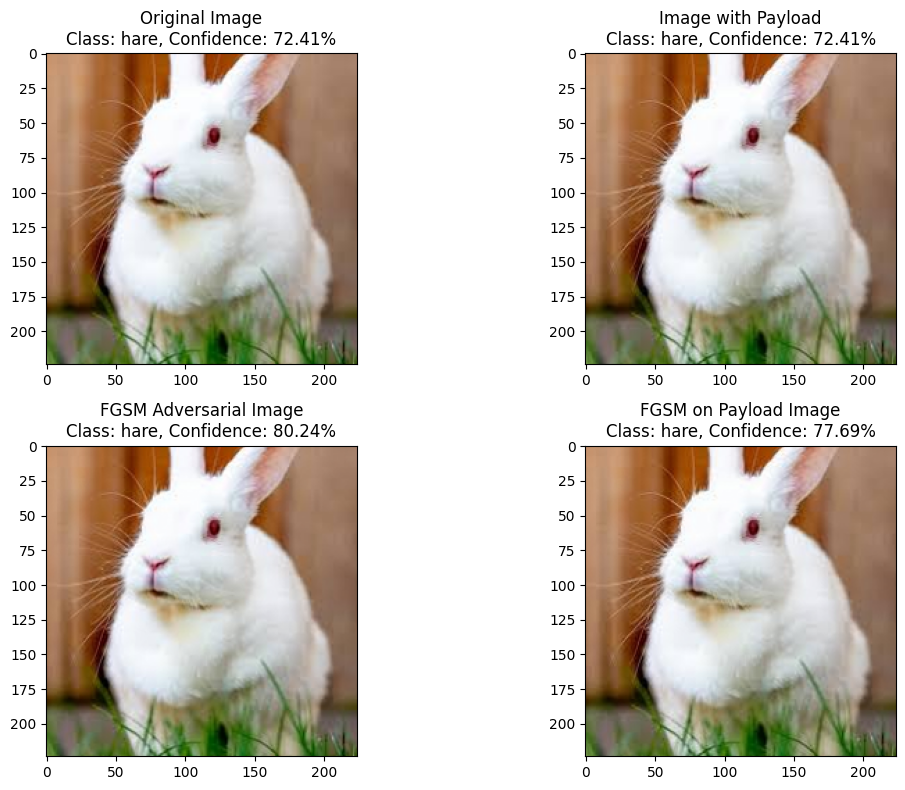

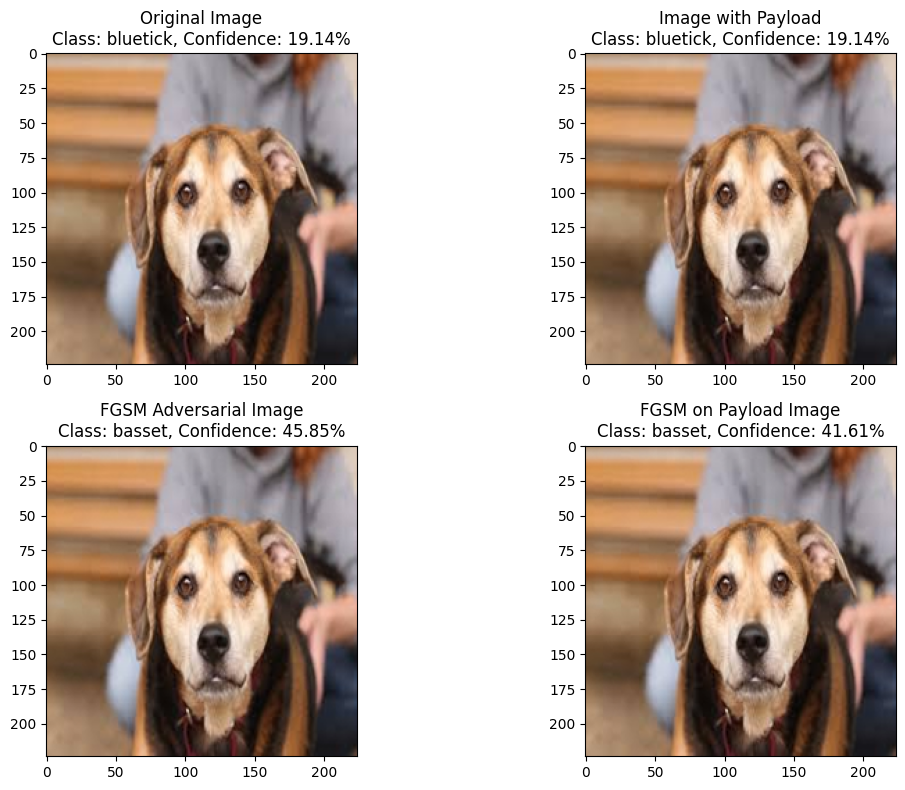

                                    extracted_payload         original_class  \
0   I$¶Ûm¶Ûm¶ÛmI$I$m¶Ûm¶Ûm¶Ûm¶ÛI$I$I$I$I$...                   knot   
1                                      ¨×mn6                  tusker   
2              ÄvÛm¶oÿ:9Ç_¦ÅøªØé~#qÛJ«mÅ_$À£@                  koala   
3                                                  À               sturgeon   
4                                             'bq8âv                   lion   
5                             9±ÿãïûÖ¥NKm}<ëUHI£øã     Scottish_deerhound   
6          ÅUª=¶äqÃ¶Ç18hµs¤oQ·ýþãÿñÀüÂHÈU"Ã                    hog   
7                                     ÿÿÿÿÿÿÿÿÿÿÿÿÿÿ                   hare   
8                                                                      tabby   
9   ´~£Û ÿÿÿÿýI$µ*­ÕRI$W$I$Ò»xN±Ã7vjit...           Egyptian_cat   
10  mÈÉ$ìJµZ¿üìv$ìI$ìIÛ¶$I¶Ûm¶ÛoìI$ìIÿÿÿÿÿÿÿ...  flat-coated_retriever   
11                           I$I$I$¶Û

In [64]:


# Load the ResNet50 model
model = ResNet50(weights='imagenet')

# Define the loss object globally
loss_object = tf.keras.losses.CategoricalCrossentropy()

# Function to create adversarial pattern using provided label
def create_adversarial_pattern(input_image, input_label):
    with tf.GradientTape() as tape:
        tape.watch(input_image)
        prediction = model(input_image)  # Get model prediction

        # Ensure input_label has shape (1, 1000)
        input_label = tf.reshape(input_label, (1, 1000))

        # Compute the loss
        loss = loss_object(input_label, prediction)

    # Compute gradients of the loss w.r.t the input image
    gradient = tape.gradient(loss, input_image)

    # Get the sign of the gradients to create perturbations
    signed_grad = tf.sign(gradient)
    return signed_grad

# FGSM Attack using the new create_adversarial_pattern function
def fgsm_attack_with_labels(image, label, epsilon):
    image_tensor = tf.convert_to_tensor(image)
    image_tensor = tf.expand_dims(image_tensor, axis=0)  # Add batch dimension
    label_tensor = tf.convert_to_tensor(label)
    label_tensor = tf.expand_dims(label_tensor, axis=0)  # Add batch dimension

    # Create adversarial pattern using the provided label
    perturbations = create_adversarial_pattern(image_tensor, label_tensor)

    # Apply the perturbations to the image
    perturbed_image = image_tensor + epsilon * perturbations

    # Ensure pixel values remain valid (clipping between 0 and 255 for uint8 images)
    perturbed_image = tf.clip_by_value(perturbed_image, 0, 255)

    return tf.squeeze(perturbed_image)  # Remove batch dimension for output

# Function to hide payload in an image
def hide_payload_in_image(image_path, payload, output_path):
    img = Image.open(image_path).convert("RGB")
    data = np.array(img)

    # Convert payload to binary and add a delimiter
    binary_payload = ''.join(format(ord(i), '08b') for i in payload) + '00000000'
    data_flat = data.flatten()

    # Embed the binary payload in the least significant bits
    for i in range(min(len(binary_payload), len(data_flat))):
        data_flat[i] = (data_flat[i] & ~1) | int(binary_payload[i])

    # Reshape and save the modified image
    data_modified = data_flat.reshape(data.shape)
    img_modified = Image.fromarray(data_modified.astype('uint8'))
    img_modified.save(output_path)

# Function to extract payload from an image
def extract_payload_from_image(image_path):
    img = Image.open(image_path).convert("RGB")
    data = np.array(img).flatten()

    binary_payload = ''
    for value in data:
        binary_payload += str(value & 1)
        if binary_payload[-8:] == '00000000':  # Stop at the delimiter
            break

    # Convert binary data back to ASCII characters
    payload = ''.join(chr(int(binary_payload[i:i+8], 2)) for i in range(0, len(binary_payload)-8, 8))
    return payload

# Function to get predicted class
def get_predicted_class(image):
    image_tensor = tf.convert_to_tensor(image, dtype=tf.float32)
    image_tensor = tf.expand_dims(image_tensor, axis=0)
    prediction = model(image_tensor)
    class_idx = np.argmax(prediction, axis=1)
    class_prob = tf.nn.softmax(prediction)

    # Decode the class name
    decoded = decode_predictions(prediction.numpy(), top=1)[0][0]
    return decoded[1], decoded[2]  # Return class name and probability

# Function to process a single image and return results
def process_image(image_path, payload, epsilon):
    # Store results
    result = {}

    # Step 1: Inject Payload into Image
    output_image_path = f'payload_{image_path}'
    hide_payload_in_image(image_path, payload, output_image_path)

    # Step 2: Extract Payload
    extracted_payload = extract_payload_from_image(output_image_path)
    result['extracted_payload'] = extracted_payload

    # Step 3: Evaluate Model on Original Image
    clean_image = keras_image.img_to_array(Image.open(image_path).resize((224, 224)))
    clean_class_name, clean_class_prob = get_predicted_class(clean_image)
    result['original_class'] = clean_class_name
    result['original_confidence'] = clean_class_prob * 100

    # Step 4: FGSM Attack on Original Image
    label_tensor = tf.keras.utils.to_categorical([np.argmax(clean_class_prob)], num_classes=1000)
    fgsm_adv_image = fgsm_attack_with_labels(clean_image, label_tensor, epsilon)
    fgsm_class_name, fgsm_class_prob = get_predicted_class(fgsm_adv_image)
    result['fgsm_class'] = fgsm_class_name
    result['fgsm_confidence'] = fgsm_class_prob * 100

    # Step 5: FGSM Attack on Payload Image
    payload_image = keras_image.img_to_array(Image.open(output_image_path).resize((224, 224)))
    fgsm_adv_payload_image = fgsm_attack_with_labels(payload_image, label_tensor, epsilon)
    fgsm_adv_payload_class_name, fgsm_adv_payload_class_prob = get_predicted_class(fgsm_adv_payload_image)
    result['fgsm_payload_class'] = fgsm_adv_payload_class_name
    result['fgsm_payload_confidence'] = fgsm_adv_payload_class_prob * 100

    # Step 6: Plot the images (original, with payload, FGSM)
    plt.figure(figsize=(12, 8))

    # Original image
    plt.subplot(2, 2, 1)
    plt.imshow(clean_image.astype('uint8'))
    plt.title(f'Original Image\nClass: {clean_class_name}, Confidence: {clean_class_prob * 100:.2f}%')

    # Image with payload
    plt.subplot(2, 2, 2)
    plt.imshow(payload_image.astype('uint8'))
    plt.title(f'Image with Payload\nClass: {clean_class_name}, Confidence: {clean_class_prob * 100:.2f}%')

    # FGSM on original image
    plt.subplot(2, 2, 3)
    plt.imshow(fgsm_adv_image.numpy().astype('uint8'))
    plt.title(f'FGSM Adversarial Image\nClass: {fgsm_class_name}, Confidence: {fgsm_class_prob * 100:.2f}%')

    # FGSM on payload image
    plt.subplot(2, 2, 4)
    plt.imshow(fgsm_adv_payload_image.numpy().astype('uint8'))
    plt.title(f'FGSM on Payload Image\nClass: {fgsm_adv_payload_class_name}, Confidence: {fgsm_adv_payload_class_prob * 100:.2f}%')

    plt.tight_layout()
    plt.show()

    # Return the result dictionary
    return result

# Process multiple images and store results
images = ['1.jpeg', '2.jpeg', '3.jpeg', '4.jpeg', '5.jpeg',  # Add up to 15  paths
          '6.jpeg', '7.jpeg', '8.jpeg', '9.jpeg', '10.jpeg',
          '11.jpeg', '12.jpeg', '13.jpeg', '14.jpeg', '15.jpeg']

epsilon = 0.1  # Epsilon for FGSM attack
payload = "Hello, World!"  # Example payload
results = []

# Loop through all the images
for image_path in images:
    result = process_image(image_path, payload, epsilon)
    results.append(result)

# Convert results into a DataFrame for easy analysis
df_results = pd.DataFrame(results)
print(df_results)

# Save results for future analysis
df_results.to_csv('image_analysis_results.csv', index=False)


In [67]:
import pandas as pd

# Load the provided CSV file
file_path = 'image_analysis_results.csv'
df_results = pd.read_csv(file_path)

# Add a column to check if the original prediction was correct
df_results['original_correct'] = df_results['original_class'] == df_results['Actual_animal']

# Add a column to check if the FGSM prediction was correct
df_results['fgsm_correct'] = df_results['fgsm_class'] == df_results['Actual_animal']

# Add a column to check if the FGSM prediction on the payload image was correct
df_results['fgsm_payload_correct'] = df_results['fgsm_payload_class'] == df_results['Actual_animal']

# Calculate the overall accuracy before FGSM (original accuracy)
original_accuracy = df_results['original_correct'].mean() * 100

# Calculate the accuracy after FGSM attack
fgsm_accuracy = df_results['fgsm_correct'].mean() * 100

# Calculate the accuracy after FGSM attack on payload-injected images
fgsm_payload_accuracy = df_results['fgsm_payload_correct'].mean() * 100

# Calculate the success rate of payload extraction (checking if payload exists and is non-empty)
payload_success_rate = (df_results['extracted_payload'].str.len() > 0).mean() * 100

# Check for a general trend of confidence levels before and after FGSM
df_results['confidence_increase_fgsm'] = df_results['fgsm_confidence'] > df_results['original_confidence']

# Calculate the percentage of cases where confidence increased after FGSM
confidence_increase_percentage = df_results['confidence_increase_fgsm'].mean() * 100

# Check confidence increase in FGSM on payload-injected images
df_results['confidence_increase_fgsm_payload'] = df_results['fgsm_payload_confidence'] > df_results['original_confidence']

# Calculate the percentage of cases where confidence increased after FGSM on payload-injected images
confidence_increase_payload_percentage = df_results['confidence_increase_fgsm_payload'].mean() * 100

# Prepare results in a dictionary
results = {
    "Original Accuracy": f"{original_accuracy:.2f}%",
    "FGSM Accuracy (Original Images)": f"{fgsm_accuracy:.2f}%",
    "FGSM Accuracy (Payload-Injected Images)": f"{fgsm_payload_accuracy:.2f}%",
    "Payload Extraction Success Rate": f"{payload_success_rate:.2f}%",
    "Confidence Increase After FGSM (Original Images)": f"{confidence_increase_percentage:.2f}%",
    "Confidence Increase After FGSM (Payload-Injected Images)": f"{confidence_increase_payload_percentage:.2f}%"
}

# Create a nicely formatted display of the results
print("\n" + "="*40)
print("            RESULTS SUMMARY")
print("="*40)

for key, value in results.items():
    print(f"{key:<50}: {value}")
print("="*40)



            RESULTS SUMMARY
Original Accuracy                                 : 53.33%
FGSM Accuracy (Original Images)                   : 53.33%
FGSM Accuracy (Payload-Injected Images)           : 53.33%
Payload Extraction Success Rate                   : 93.33%
Confidence Increase After FGSM (Original Images)  : 100.00%
Confidence Increase After FGSM (Payload-Injected Images): 93.33%


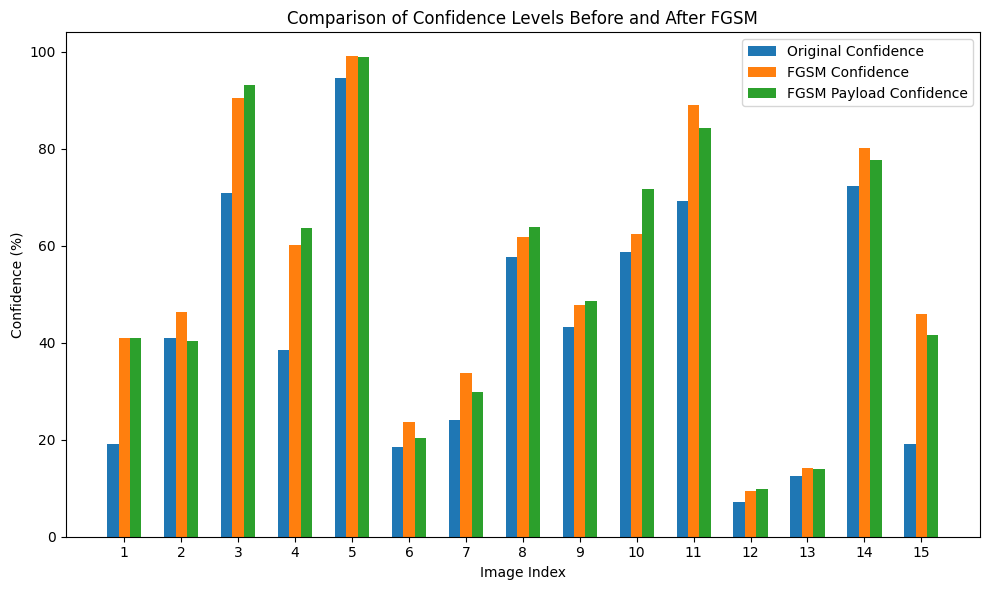

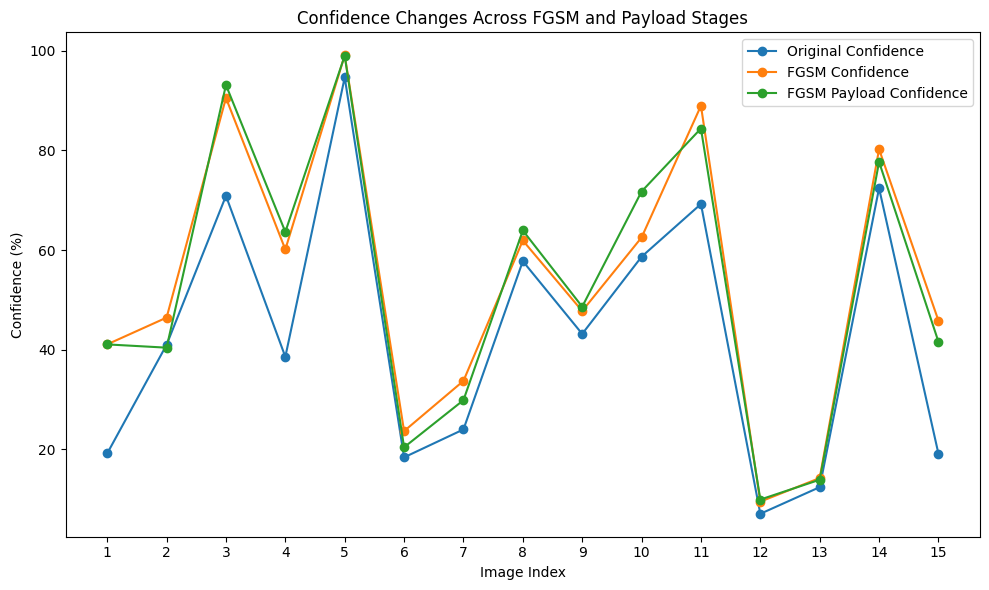

In [68]:
import matplotlib.pyplot as plt

# Prepare data for visualization
original_confidence = df_results['original_confidence']
fgsm_confidence = df_results['fgsm_confidence']
fgsm_payload_confidence = df_results['fgsm_payload_confidence']

# Image labels for the x-axis
image_labels = df_results.index + 1  # Assuming image numbers as labels (1 to 15)

# Create a bar graph comparing confidence levels
plt.figure(figsize=(10, 6))

plt.bar(image_labels - 0.2, original_confidence, width=0.2, label='Original Confidence', align='center')
plt.bar(image_labels, fgsm_confidence, width=0.2, label='FGSM Confidence', align='center')
plt.bar(image_labels + 0.2, fgsm_payload_confidence, width=0.2, label='FGSM Payload Confidence', align='center')

plt.xlabel('Image Index')
plt.ylabel('Confidence (%)')
plt.title('Comparison of Confidence Levels Before and After FGSM')
plt.xticks(image_labels)
plt.legend()
plt.tight_layout()

# Show the bar graph
plt.show()

# Now create a line graph to show confidence changes per image
plt.figure(figsize=(10, 6))

plt.plot(image_labels, original_confidence, marker='o', label='Original Confidence')
plt.plot(image_labels, fgsm_confidence, marker='o', label='FGSM Confidence')
plt.plot(image_labels, fgsm_payload_confidence, marker='o', label='FGSM Payload Confidence')

plt.xlabel('Image Index')
plt.ylabel('Confidence (%)')
plt.title('Confidence Changes Across FGSM and Payload Stages')
plt.xticks(image_labels)
plt.legend()
plt.tight_layout()

# Show the line graph
plt.show()
